In [1]:
# ! python segment/predict.py \
#     --imgsz 1600 \
#     --source $WORKDIR/users/2221/FishPonds/data/fishponds_split-1_yolov7/test/images \
#     --weights $WORKDIR/users/2221/FishPonds/YOLO/yolov7/seg/runs/train-seg/epochs1000/weights/best.pt \
#     --save-txt \
#     --save-conf \
#     --conf-thres 0.50 \
#     --name pred_testdataset

# This notebook:
* convert the predicted masks to points/a polygon
* Save the predictions as classes as TP, FN or FP in npz files
* Plot some polygons on top of images


THIS NOTEBOOK ASSUMES YOU ARE ON THE ROOT OF THE PATH WHERE THE PREDICTIONS ARE SAVED

```
python segment/predict.py \
   --imgsz 1600 \
   --source $WORKDIR/FishPonds/data/fishponds_split-1_yolov7/test/images \
   --weights $WORKDIR/FishPonds/YOLO/yolov7/seg/runs/train-seg/epochs1000/weights/best.pt \
   --save-txt \
   --save-conf \
   --conf-thres 0.50 \
   --name FOLDER
```

PREDICTIONS ARE SAVED IN SOMETHING LIKE: ```runs/predict-seg/FOLDER```

You also need the true annotations.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob
import os
import pandas as pd
from shapely.geometry import box, Polygon
from shapely.validation import make_valid
from matplotlib import patches
from pylabel import importer
from shapely.validation import make_valid
import scipy

%config InlineBackend.figure_format='retina'

In [ ]:
DATA_PATH_TO = "/lustre/davis/users/2221/FishPonds/data/"

In [ ]:
def scale_masks(img1_shape, masks, img0_shape, ratio_pad=None):
    """
    img1_shape: model input shape, [h, w]
    img0_shape: origin pic shape, [h, w, 3]
    masks: [h, w, num]
    resize for the most time
    """
    # Rescale coords (xyxy) from img1_shape to img0_shape
    if ratio_pad is None:  # calculate from img0_shape
        gain = min(img1_shape[0] / img0_shape[0], img1_shape[1] / img0_shape[1])  # gain  = old / new
        pad = (img1_shape[1] - img0_shape[1] * gain) / 2, (img1_shape[0] - img0_shape[0] * gain) / 2  # wh padding
    else:
        gain = ratio_pad[0][0]
        pad = ratio_pad[1]
    tl_pad = int(pad[1]), int(pad[0])  # y, x
    br_pad = int(img1_shape[0] - pad[1]), int(img1_shape[1] - pad[0])

    if len(masks.shape) < 2:
        raise ValueError(f'"len of masks shape" should be 2 or 3, but got {len(masks.shape)}')
    # masks_h, masks_w, n
    masks = masks[tl_pad[0]:br_pad[0], tl_pad[1]:br_pad[1]]
    masks = cv2.resize(masks, (img0_shape[1], img0_shape[0]))

    # keepdim
    if len(masks.shape) == 2:
        masks = masks[:, :, None]

    return masks

def mask_to_polygons(mask: np.ndarray):
    """
    Converts a binary mask to a list of polygons.

    Parameters:
        mask (np.ndarray): A binary mask represented as a 2D NumPy array of
            shape `(H, W)`, where H and W are the height and width of
            the mask, respectively.

    Returns:
        List[np.ndarray]: A list of polygons, where each polygon is represented by a
            NumPy array of shape `(N, 2)`, containing the `x`, `y` coordinates
            of the points. Polygons with fewer points than `MIN_POLYGON_POINT_COUNT = 3`
            are excluded from the output.
    """

    contours, _ = cv2.findContours(
        mask.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE
    )
    return [
        np.squeeze(contour, axis=1)
        for contour in contours
        if contour.shape[0] >= 5
    ]

In [3]:
def create_iou_matrix(n_true, n_pred, p_true, p_pred, idx_validation, iou_validation):
    iou_matrix = np.zeros((n_true, n_pred))
    for i in range(n_true):
        for j in range(n_pred):
            polygon_true = make_valid(Polygon(p_true[i]))
            polygon_pred = make_valid(Polygon(p_pred[j]))
            # print(i, j)
            polygon_intersection = polygon_true.intersection(polygon_pred).area
            polygon_union = polygon_true.union(polygon_pred).area
            iou_matrix[i, j] = polygon_intersection / polygon_union 
    idxs_true, idxs_pred = scipy.optimize.linear_sum_assignment(1 - iou_matrix)
    idx_validation.append([idxs_true, idxs_pred])
    iou_validation.append(iou_matrix)
    # ious_actual = iou_matrix[idxs_true, idxs_pred]
    return idx_validation, iou_validation

# Load the predictions

In [ ]:
SPLIT = '_valid' #or ''

MODEL_NAME = f"from_zero_ogun_delta_combine_background_v3_v0{SPLIT}"

path_folder = f"ogun_delta_{MODEL_NAME}"

path_to_masks_ogun = glob.glob(f"runs/predict-seg/{path_folder}/labels/mask_*")
path_to_pred = glob.glob(f"runs/predict-seg/{path_folder}/labels/*.txt")
path_to_imgs = glob.glob(f"runs/predict-seg/{path_folder}/*.jpg")



In [6]:
path_to_masks_ogun.sort()
path_to_pred.sort()
path_to_imgs.sort()

In [7]:
path_to_masks_ogun

['runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/labels/mask_Abia_g3c15r13.npy',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/labels/mask_delta_000_20_png.rf.37466afecc4a8237b1e443d4f8674cfc.npy',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/labels/mask_delta_102_13_png.rf.1aa8dbe083baf396105c6fd778624333.npy',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/labels/mask_delta_121_01_png.rf.8c71343dec578879de91165adcc5a4b7.npy',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/labels/mask_delta_121_12_png.rf.ee735b2fddc63171e08352be603d316e.npy',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/labels/mask_delta_122_12_png.rf.d437ad5114824c7089fbc643804ab1cf.npy',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/labels/mask_delta_132_01_png.rf.61e4911

In [8]:
len(path_to_masks_ogun)

20

In [9]:
path_to_imgs, len(path_to_imgs)

(['runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_000_20_png.rf.37466afecc4a8237b1e443d4f8674cfc.jpg',
  'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_000_33_crop.jpg',
  'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_102_13_png.rf.1aa8dbe083baf396105c6fd778624333.jpg',
  'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_111_21_crop.jpg',
  'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_121_01_png.rf.8c71343dec578879de91165adcc5a4b7.jpg',
  'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_121_12_png.rf.ee735b2fddc63171e08352be603d316e.jpg',
  'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_122_12_png.rf.d437ad5114824c7089fbc643804ab1cf.jpg',
  'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0

# Decide for Ogun or Delta state

In [ ]:
STATE = 'Delta'
if STATE == 'Delta':
    path_to_imgs = [x for x in path_to_imgs if 'delta' in x.split('/')[-1]]
    path_to_imgs = [x for x in path_to_imgs if 'crop' not in x.split('/')[-1]]
elif STATE == 'Ogun':
    path_to_imgs = [x for x in path_to_imgs if 'y' in x.split('/')[-1]]
    path_to_imgs = [x for x in path_to_imgs if 'null' not in x.split('/')[-1]]


In [11]:
path_to_imgs

['runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_000_20_png.rf.37466afecc4a8237b1e443d4f8674cfc.jpg',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_102_13_png.rf.1aa8dbe083baf396105c6fd778624333.jpg',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_121_01_png.rf.8c71343dec578879de91165adcc5a4b7.jpg',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_121_12_png.rf.ee735b2fddc63171e08352be603d316e.jpg',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_122_12_png.rf.d437ad5114824c7089fbc643804ab1cf.jpg',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_132_01_png.rf.61e4911390503e97e94956355e31920f.jpg',
 'runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/delta_300_30_png.rf.674fe668543de75a9dfe27b22f3fd565.jpg',
 'runs/predic

In [ ]:
# import roboflow

# rf = roboflow.Roboflow(api_key="kP4jD6wG7ef8UZr7pKBw")
# project = rf.workspace().project("fishponds_split")
# dataset = project.version("1").download("coco-segmentation")



# Extract true annotations for the corresponding state

In [ ]:
def func_extract_delta():
    path_to_train = f"{DATA_PATH_TO}Delta-annotations-3_coco/train/"
    path_to_train_images = glob.glob(f"{DATA_PATH_TO}Delta-annotations-3_coco/train/*.jpg")
    # path_to_test_images = glob.glob(path_to_test_images + "*.jpg")

    train_annotations = glob.glob(f"{DATA_PATH_TO}Delta-annotations-3_coco/train/*.json")
    dataset_train = importer.ImportCoco(train_annotations[0], path_to_images=path_to_train, name="BCCD_coco")
    df_annon_train = dataset_train.df[['img_folder', 'img_filename','img_width',
        'img_height','ann_bbox_xmin',
        'ann_bbox_ymin', 'ann_bbox_xmax', 'ann_bbox_ymax', 'ann_area', 'ann_segmentation' ]]

    # valid
    path_to_valid = f"{DATA_PATH_TO}Delta-annotations-3_coco/valid/"
    path_to_valid_images = glob.glob(f"{DATA_PATH_TO}Delta-annotations-3_coco/valid/*.jpg")
    # path_to_test_images = glob.glob(path_to_test_images + "*.jpg")

    valid_annotations = glob.glob(f"{DATA_PATH_TO}Delta-annotations-3_coco/valid/*.json")
    dataset_valid = importer.ImportCoco(valid_annotations[0], path_to_images=path_to_valid, name="BCCD_coco")
    df_annon_valid = dataset_valid.df[['img_folder', 'img_filename','img_width',
        'img_height','ann_bbox_xmin',
        'ann_bbox_ymin', 'ann_bbox_xmax', 'ann_bbox_ymax', 'ann_area', 'ann_segmentation' ]]

    # test
    path_to_test = f"{DATA_PATH_TO}Delta-annotations-3_coco/test/"
    path_to_test_images = glob.glob(f"{DATA_PATH_TO}Delta-annotations-3_coco/test/*.jpg")
    # path_to_test_images = glob.glob(path_to_test_images + "*.jpg")

    test_annotations = glob.glob(f"{DATA_PATH_TO}Delta-annotations-3_coco/test/*.json")
    dataset_test = importer.ImportCoco(test_annotations[0], path_to_images=path_to_test, name="BCCD_coco")
    df_annon_test = dataset_test.df[['img_folder', 'img_filename','img_width',
        'img_height','ann_bbox_xmin',
        'ann_bbox_ymin', 'ann_bbox_xmax', 'ann_bbox_ymax', 'ann_area', 'ann_segmentation' ]]
    
    return (path_to_train, path_to_train_images, train_annotations, dataset_train, df_annon_train, 
                path_to_valid, path_to_valid_images, valid_annotations, dataset_valid, df_annon_valid, 
                path_to_test, path_to_test_images, test_annotations, dataset_test, df_annon_test)


def func_extract_ogun():
    #train
    path_to_train = f"{DATA_PATH_TO}fishponds_split-4_coco/train/"
    path_to_train_images = glob.glob(f"{DATA_PATH_TO}fishponds_split-4_coco/train/*.jpg")

    train_annotations = glob.glob(f"{DATA_PATH_TO}fishponds_split-4_coco/train/*.json")
    dataset_train = importer.ImportCoco(train_annotations[0], path_to_images=path_to_train, name="BCCD_coco")
    df_annon_train = dataset_train.df[['img_folder', 'img_filename','img_width',
        'img_height','ann_bbox_xmin',
        'ann_bbox_ymin', 'ann_bbox_xmax', 'ann_bbox_ymax', 'ann_area', 'ann_segmentation' ]]

    # valid
    path_to_valid = f"{DATA_PATH_TO}fishponds_split-4_coco/valid/"
    path_to_valid_images = glob.glob(f"{DATA_PATH_TO}fishponds_split-4_coco/valid/*.jpg")

    valid_annotations = glob.glob(f"{DATA_PATH_TO}fishponds_split-4_coco/valid/*.json")
    dataset_valid = importer.ImportCoco(valid_annotations[0], path_to_images=path_to_valid, name="BCCD_coco")
    df_annon_valid = dataset_valid.df[['img_folder', 'img_filename','img_width',
        'img_height','ann_bbox_xmin',
        'ann_bbox_ymin', 'ann_bbox_xmax', 'ann_bbox_ymax', 'ann_area', 'ann_segmentation' ]]

    # test
    path_to_test = f"{DATA_PATH_TO}fishponds_split-4_coco/test/"
    path_to_test_images = glob.glob(f"{DATA_PATH_TO}fishponds_split-4_coco/test/*.jpg")

    test_annotations = glob.glob(f"{DATA_PATH_TO}fishponds_split-4_coco/test/*.json")
    dataset_test = importer.ImportCoco(test_annotations[0], path_to_images=path_to_test, name="BCCD_coco")
    df_annon_test = dataset_test.df[['img_folder', 'img_filename','img_width',
        'img_height','ann_bbox_xmin',
        'ann_bbox_ymin', 'ann_bbox_xmax', 'ann_bbox_ymax', 'ann_area', 'ann_segmentation' ]]
    
    return (path_to_train, path_to_train_images, train_annotations, dataset_train, df_annon_train, 
            path_to_valid, path_to_valid_images, valid_annotations, dataset_valid, df_annon_valid, 
            path_to_test, path_to_test_images, test_annotations, dataset_test, df_annon_test)

In [ ]:
if STATE == 'Delta':
    func_extract_data = func_extract_delta()
elif STATE == 'Ogun':
   func_extract_data = func_extract_ogun()

In [ ]:
(path_to_train, path_to_train_images, train_annotations, dataset_train, df_annon_train, 
 path_to_valid, path_to_valid_images, valid_annotations, dataset_valid, df_annon_valid, 
 path_to_test, path_to_test_images, test_annotations, dataset_test, df_annon_test) = func_extract_data

# Create IOU matrix and TP, FN, FP values

In [ ]:
iou_testing = []
idx_testing = []
all_area_pred = []
all_area_true = []
all_length_pred = []
all_length_true = []
TP_all_area_pred = []
TP_all_area_true = []
TP_all_length_pred = []
TP_all_length_true = []
TP_points = []

FP_all_area_pred = []
FP_all_length_pred = []
FP_points = []


FN_all_area_true = []
FN_all_length_true = []
FN_points = []


total_pred = 0
total_true = 0
total_masks = 0
img = cv2.imread(path_to_test_images[0])

#loop over the images to extract the name of the img
for il in range(len(path_to_imgs)):
    TP_by_points = []
    FP_by_points = []
    FN_by_points = []
    
    file_img_name_short = '.'.join(path_to_imgs[il].split('/')[-1].split('.')[:-1])
    file_img_name = path_to_imgs[il].split('/')[-1]
    
    
    print(file_img_name)
    # find the split of the image, train, test or valid
    if len(glob.glob(os.path.join(path_to_train, file_img_name))) == 1:
        long_file_name = glob.glob(os.path.join(path_to_train, file_img_name))[0].split('/')[-1]
        test_0_df = df_annon_train[df_annon_train['img_filename'] == long_file_name]
        print("train")
    elif len(glob.glob(os.path.join(path_to_test, file_img_name))) == 1:
        long_file_name = glob.glob(os.path.join(path_to_test, file_img_name))[0].split('/')[-1]
        test_0_df = df_annon_test[df_annon_test['img_filename'] == long_file_name]
        print("test")
        
    elif len(glob.glob(os.path.join(path_to_valid, file_img_name))) == 1:
        long_file_name = glob.glob(os.path.join(path_to_valid, file_img_name))[0].split('/')[-1]
        test_0_df = df_annon_valid[df_annon_valid['img_filename'] == long_file_name]
        print("valid")
    else:
        print("no annotations, check img name")
        # break
        
    # save true annotations
    p_true = []
    if len(test_0_df) >= 1:
        for i in range(len(test_0_df)):
            seg = test_0_df.iloc[i]['ann_segmentation'][0]
            poly_test = [(seg[j], seg[j+1]) for j in range(0, len(seg), 2)]
            if len(poly_test) < 4:
                print(f"poly has {len(poly_test)} elements {poly_test}")
            p_true.append(poly_test)
            ppolygon_area = Polygon(poly_test).area
            ppolygon_length = Polygon(poly_test).length
            all_area_true.append(ppolygon_area)
            all_length_true.append(ppolygon_length)
    # if no true annotation create zero polygon
    else:
        p_true = ['nada']#[[(0,0),(0,0),(0,0),(0,0)]]
    print(len(p_true))
    p_pred = []
    # find the mask of the image, the mask is the prediction, not all images have a mask
    file_to_mask = [x for x in path_to_masks_ogun if file_img_name_short in x] 
    print(file_img_name_short, file_to_mask)
    # if mask exist
    if len(file_to_mask) == 1:
        file_to_mask = file_to_mask[0]
        print(file_to_mask)
        if os.path.isfile(file_to_mask):
            mask_test = np.load(file_to_mask)
            print("size mask")
            print(mask_test.shape)
            total_masks = mask_test.shape[0]+total_masks
            masks_true_size = np.zeros((len(mask_test), img.shape[0], img.shape[1], 1))
            mask_to_polygons_list = []
            # scale mask to image size (2000x2000), the model predicts masks of size (1600x1600)
            # convert mask to polyogn
            for id in range(len(mask_test)):
                masks_true_size[id] = scale_masks((mask_test.shape[1],mask_test.shape[-1]), np.uint8(mask_test[id]), (img.shape[0], img.shape[1], 3))
                mask_to_polygon = mask_to_polygons(masks_true_size[id])
                if len(mask_to_polygon) > 1:
                    sizes_len = []
                    for ixs in range(len(mask_to_polygon)):
                        sizes_len.append(len(mask_to_polygon[ixs]))
                    mask_to_polygons_list.append(mask_to_polygon[np.argmax(np.array(sizes_len))])
                else:
                    mask_to_polygons_list.append(mask_to_polygon[0])
            
            for i in range(mask_test.shape[0]):
                points = [[mask_to_polygons_list[i][ixs, 0].item(), mask_to_polygons_list[i][ixs, 1].item()] for ixs in range(len(mask_to_polygons_list[i]))] 
                p_pred.append(points)
                ppolygon_area = Polygon(points).area
                ppolygon_length = Polygon(points).length
                all_area_pred.append(ppolygon_area)
                all_length_pred.append(ppolygon_length)
        else:
            print("mask file no exist")
        n_true = len(p_true)
        n_pred = len(p_pred)
        print("n true, n pred")
        print(n_true, n_pred)
        total_pred = n_pred + total_pred
        total_true = n_true + total_true
        
        MAX_DIST = 1.0
        MIN_IOU = 0.0

        # only one true annotation
        if n_true == 1:
            # if the area is 0, is the p_true = [nada] from above, all pred are FP
            if p_true[0] == 'nada':
                iou_testing.append(np.array([n_pred]))
                idx_testing.append(n_pred)
            else:
                # real one single annotations, but no predictions
                if n_pred == 0:
                    iou_testing.append(np.expand_dims(np.array([[n_true], [n_true], [n_true]]), axis=-1))
                    idx_testing.append(n_true)
                else:
                    idx_testing, iou_testing = create_iou_matrix(n_true, n_pred, p_true, p_pred, idx_testing, iou_testing)
        else:
            if n_pred == 0:
                iou_testing.append(np.expand_dims(np.array([[n_true], [n_true], [n_true]]), axis=-1))
                idx_testing.append(n_true)
            else:
                # NUM_GT x NUM_PRED: create iou matrix
                idx_testing, iou_testing = create_iou_matrix(n_true, n_pred, p_true, p_pred, idx_testing, iou_testing)
    
        # save True Positives
        TP_pred_indices = []
        TP_true_indices = []
        # true annotations and more than one
        if len(iou_testing[-1].shape) == 2: 
            TP_indices = np.argwhere(iou_testing[-1][idx_testing[-1][0], idx_testing[-1][1]] > 0.50).flatten()
            # if there is iou match
            if len(TP_indices) > 0:
                for pi_pred in TP_indices:
                    TP_selected_points = p_pred[idx_testing[-1][1][pi_pred]]
                    TP_pred_indices.append(idx_testing[-1][1][pi_pred])
                    TP_by_points.append(TP_selected_points)
                    ppolygon_area = Polygon(TP_selected_points).area
                    ppolygon_length = Polygon(TP_selected_points).length
                    TP_all_area_pred.append(ppolygon_area)
                    TP_all_length_pred.append(ppolygon_length)
    
                    TP_selected_points = p_true[idx_testing[-1][0][pi_pred]]
                    TP_true_indices.append(idx_testing[-1][0][pi_pred])
                    ppolygon_area = Polygon(TP_selected_points).area
                    ppolygon_length = Polygon(TP_selected_points).length
                    TP_all_area_true.append(ppolygon_area)
                    TP_all_length_true.append(ppolygon_length)
    
                mask = np.full(n_pred,True,dtype=bool)
                mask[np.array(TP_pred_indices)] = False
                
                # Save False Positives
                FP_pred_indices = np.arange(n_pred)[mask]
                for fpi_pred in FP_pred_indices:
                    FP_selected_points = p_pred[fpi_pred]
                    FP_by_points.append(FP_selected_points)
                    ppolygon_area = Polygon(FP_selected_points).area
                    ppolygon_length = Polygon(FP_selected_points).length
                    FP_all_area_pred.append(ppolygon_area)
                    FP_all_length_pred.append(ppolygon_length)
    
    
                mask = np.full(n_true,True,dtype=bool)
                mask[np.array(TP_true_indices)] = False
                
                # Save False Negatives
                FN_true_indices = np.arange(n_true)[mask]
                for fni_true in FN_true_indices:
                    FN_selected_points = p_true[fni_true]
                    FN_by_points.append(FN_selected_points)
    
                    ppolygon_area = Polygon(FN_selected_points).area
                    ppolygon_length = Polygon(FN_selected_points).length
                    FN_all_area_true.append(ppolygon_area)
                    FN_all_length_true.append(ppolygon_length)
                    
            # no iou match, then False Positives and False Negatives
            else:
                for fpi_pred in range(n_pred):
                    FP_selected_points = p_pred[fpi_pred]
                    # FP_pred_indices.append(idx_testing[-1][pi_pred][-1])
                    FP_by_points.append(FP_selected_points)
                    ppolygon_area = Polygon(FP_selected_points).area
                    ppolygon_length = Polygon(FP_selected_points).length
                    FP_all_area_pred.append(ppolygon_area)
                    FP_all_length_pred.append(ppolygon_length)
                for fni_true in range(n_true):
                    FN_selected_points = p_true[fni_true]
                    FN_by_points.append(FN_selected_points)
                    ppolygon_area = Polygon(FN_selected_points).area
                    ppolygon_length = Polygon(FN_selected_points).length
                    FN_all_area_true.append(ppolygon_area)
                    FN_all_length_true.append(ppolygon_length)
    
        # no true annotations
        elif len(iou_testing[-1].shape) == 1: 
            for fpi_pred in range(n_pred):
                FP_selected_points = p_pred[fpi_pred]
                # FP_pred_indices.append(idx_testing[-1][pi_pred][-1])
                FP_by_points.append(FP_selected_points)
                ppolygon_area = Polygon(FP_selected_points).area
                ppolygon_length = Polygon(FP_selected_points).length
                FP_all_area_pred.append(ppolygon_area)
                FP_all_length_pred.append(ppolygon_length)
        # no predictions
        else:
            for fni_true in range(n_true):
                FN_selected_points = p_true[fni_true]
                FN_by_points.append(FN_selected_points)
                ppolygon_area = Polygon(FN_selected_points).area
                ppolygon_length = Polygon(FN_selected_points).length
                FN_all_area_true.append(ppolygon_area)
                FN_all_length_true.append(ppolygon_length)
        TP_points.append(TP_by_points)
        FP_points.append(FP_by_points)
        FN_points.append(FN_by_points)
    else:
        # if there is no mask, 1. no true annotation, no predictions, 2. no preidicitions
        print('no mask, no pred')
        TP_points.append([])
        FP_points.append([])
        if len(p_true) == 1 :
            # if the area is 0, is the p_true = [nada] from above
            if p_true[0] == 'nada':
                print('no pred no true annotation, empty image')
                FN_points.append([])
                continue
            else:
                # area of p_true is > 0 then this is a FN
                iou_testing.append(np.expand_dims(np.array([[len(p_true)], [len(p_true)], [len(p_true)]]), axis=-1))
                idx_testing.append(len(p_true))
        else:
            iou_testing.append(np.expand_dims(np.array([[len(p_true)], [len(p_true)], [len(p_true)]]), axis=-1))
            idx_testing.append(len(p_true))

        for fni_true in range(len(p_true)):
            FN_selected_points = p_true[fni_true]
            FN_by_points.append(FN_selected_points)
            ppolygon_area = Polygon(FN_selected_points).area
            ppolygon_length = Polygon(FN_selected_points).length
            FN_all_area_true.append(ppolygon_area)
            FN_all_length_true.append(ppolygon_length)
        FN_points.append(FN_by_points)

delta_000_20_png.rf.37466afecc4a8237b1e443d4f8674cfc.jpg
valid
74
delta_000_20_png.rf.37466afecc4a8237b1e443d4f8674cfc ['runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/labels/mask_delta_000_20_png.rf.37466afecc4a8237b1e443d4f8674cfc.npy']
runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/labels/mask_delta_000_20_png.rf.37466afecc4a8237b1e443d4f8674cfc.npy
size mask
(75, 1600, 1600)
n true, n pred
74 75
delta_102_13_png.rf.1aa8dbe083baf396105c6fd778624333.jpg
valid
7
delta_102_13_png.rf.1aa8dbe083baf396105c6fd778624333 ['runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/labels/mask_delta_102_13_png.rf.1aa8dbe083baf396105c6fd778624333.npy']
runs/predict-seg/ogun_delta_from_zero_ogun_delta_combine_background_v3_v0_valid/labels/mask_delta_102_13_png.rf.1aa8dbe083baf396105c6fd778624333.npy
size mask
(1, 1600, 1600)
n true, n pred
7 1
delta_121_01_png.rf.8c71343dec578879de91165adcc5a4b7.jpg
valid
21


In [16]:
total_pred, total_masks, total_true

(502, 502, 514)

In [17]:
len(all_area_pred), len(all_area_true), len(all_length_pred), len(all_length_true)

(502, 514, 502, 514)

In [18]:
len(TP_all_area_pred), len(TP_all_area_true), len(TP_all_length_pred), len(TP_all_length_true)

(451, 451, 451, 451)

In [19]:
len(FN_all_area_true), len(FN_all_length_true),

(63, 63)

In [20]:
len(FP_all_area_pred), len(FP_all_length_pred),

(51, 51)

In [21]:
len(TP_points), len(FP_points), len(FN_points)

(10, 10, 10)

In [22]:
len(path_to_masks_ogun)

20

In [23]:
os.path.join(path_to_test, file_img_name)

'/lustre/davis/users/2221/FishPonds/data/Delta-annotations-3_coco/test/delta_320_13_png.rf.97c82bff6252caf8fd07f9a89854f13f.jpg'

In [24]:
250/2

125.0

In [ ]:
len(path_to_masks_ogun)


# Plot some predictions

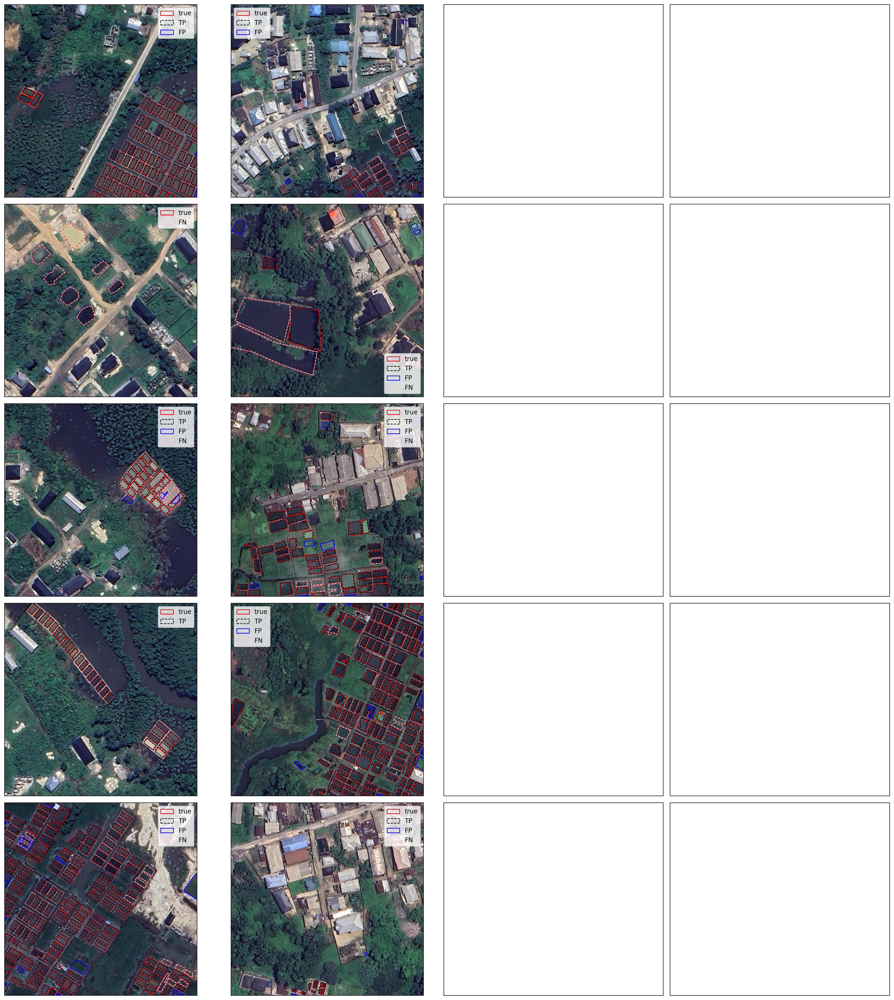

In [29]:
import json
fig, ax = plt.subplots(5, 4, figsize=(20,22))
ax = ax.ravel(order='F')

for il in range(len(path_to_imgs)):#len(path_to_test_images)):
    FNs_poly = []
    TPs_poly = []
    FPs_poly = []
    # file_img_name = path_to_test_images[il]

    # file_img_name = '_'.join(path_to_masks_ogun[il].split('/')[-1].split('_')[1:]).replace('.npy', '.jpg')
    file_img_name_short = path_to_imgs[il].split('/')[-1].split('.')[0]
    file_img_name= path_to_imgs[il].split('/')[-1]
    
    # print(file_img_name)
    if len(glob.glob(os.path.join(path_to_train, file_img_name))) == 1:
        long_file_name = glob.glob(os.path.join(path_to_train, file_img_name))[0].split('/')[-1]
        img = cv2.imread(os.path.join(path_to_train, long_file_name))
        test_0_df = df_annon_train[df_annon_train['img_filename'] == long_file_name]
        # print("train")
    elif len(glob.glob(os.path.join(path_to_test, file_img_name))) == 1:
        long_file_name = glob.glob(os.path.join(path_to_test, file_img_name))[0].split('/')[-1]
        img = cv2.imread(os.path.join(path_to_test, long_file_name))
        test_0_df = df_annon_test[df_annon_test['img_filename'] == long_file_name]
        # print("test")
    elif len(glob.glob(os.path.join(path_to_valid, file_img_name))) == 1:
        long_file_name = glob.glob(os.path.join(path_to_valid, file_img_name))[0].split('/')[-1]
        img = cv2.imread(os.path.join(path_to_valid, long_file_name))
        test_0_df = df_annon_valid[df_annon_valid['img_filename'] == long_file_name]
        # print("valid")

    
    # file_img_name = '_'.join(path_to_masks_ogun[il].split('/')[-1].split('_')[1:]).replace('.npy', '.jpg')

    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax[il].imshow(img)
    # ax[il].set_title(file_img_name.split("/")[-1].split(".")[0])

    # plot true labels
    if len(test_0_df) > 1:
        # p_true = []
        for i in range(len(test_0_df)):
            seg = test_0_df.iloc[i]['ann_segmentation'][0]
            poly_test = [(seg[j], seg[j+1]) for j in range(0, len(seg), 2)]
            # p_true.append(poly_test)
            polygon_test = patches.Polygon(poly_test, closed=True, edgecolor='red', fill=False)
            ax[il].add_patch(polygon_test)
            
        polygon_test = patches.Polygon(poly_test, closed=True, edgecolor='red', fill=False, label="true")
        ax[il].add_patch(polygon_test)
        
    # plot TP
    if len(TP_points[il]) >= 1:
        for i in range(len(TP_points[il])):
            polygon_test = patches.Polygon(TP_points[il][i], closed=True, edgecolor='black', fill=False, linestyle='--')
            ax[il].add_patch(polygon_test)
            TPs_poly.append(TP_points[il][i])
        polygon_test = patches.Polygon(TP_points[il][i], closed=True, edgecolor='black', fill=False, linestyle='--', label="TP")
        ax[il].add_patch(polygon_test)

    # plot FP
    if len(FP_points[il]) >= 1:
        for i in range(len(FP_points[il])):
            polygon_test = patches.Polygon(FP_points[il][i], closed=True, edgecolor='blue', fill=False)
            ax[il].add_patch(polygon_test)
            FPs_poly.append(FP_points[il][i])
            
        polygon_test = patches.Polygon(FP_points[il][i], closed=True, edgecolor='blue', fill=False, label="FP")
        ax[il].add_patch(polygon_test)

    # plot FN
    if len(FN_points[il]) >= 1:
        for i in range(len(FN_points[il])):
            polygon_test = patches.Polygon(FN_points[il][i], closed=True, edgecolor='pink', fill=False, linestyle='--')
            ax[il].add_patch(polygon_test)
            FNs_poly.append(FN_points[il][i])
            
        polygon_test = patches.Polygon(FN_points[il][i], closed=True, edgecolor='pink', fill=False, linestyle='--', label="FN")
        ax[il].add_patch(polygon_test)
    ax[il].legend()

    ax[il].set_xticks([])   
    ax[il].set_yticks([])

for il in range(10, 20):
    ax[il].set_xticks([])   
    ax[il].set_yticks([])

plt.tight_layout()
# plt.savefig("delta_examples_agu.png", dpi=300 )
    # save_tp = f"runs/predict-seg/{path_folder}/labels/poly_TPs_{file_img_name.split('/')[-1].split('.')[0]}.npz"
    # np.savez(save_tp, *TPs_poly) 
    # save_fn = f"runs/predict-seg/{path_folder}/labels/poly_FNs_{file_img_name.split('/')[-1].split('.')[0]}.npz"
    # np.savez(save_fn, *FNs_poly) 
    # save_fp = f"runs/predict-seg/{path_folder}/labels/poly_FPs_{file_img_name.split('/')[-1].split('.')[0]}.npz"
    # np.savez(save_fp, *FPs_poly)

In [30]:
path_folder

'ogun_delta_fine_tune_final_dataset_freeze_v02_2_valid'

# Some plots to see some geometrical properties (area) of the predictions

In [31]:
# plt.figure(figsize=(6,8))
# plt.subplot(211)
# plt.hist(np.array(TP_all_area_pred) * 0.1*0.1, label="Prediction", density=True)
# plt.hist(np.array(TP_all_area_true) * 0.1*0.1, color="red", label="True", density=True, alpha=0.4)
# plt.legend()
# plt.xlabel("area FishPond in m2")

# plt.subplot(212)
# plt.hist(np.array(TP_all_length_pred) * 0.1, label="Prediction", density=True)
# plt.hist(np.array(TP_all_length_true) * 0.1, color="red", label="True", density=True, alpha=0.4)
# # plt.legend()
# plt.xlabel("length FishPond in m")
# plt.tight_layout()

# plt.show()

In [32]:
# plt.figure(figsize=(6,8))
# plt.subplot(211)
# plt.hist(np.array(FP_all_area_pred) * 0.1*0.1, label="FP Prediction", density=True)
# plt.hist(np.array(TP_all_area_true) * 0.1*0.1, color="red", label="True", density=True, alpha=0.4)
# plt.legend()
# plt.xlabel("area FishPond in m2")

# plt.subplot(212)
# plt.hist(np.array(FP_all_length_pred) * 0.1, label="FP Prediction", density=True)
# plt.hist(np.array(TP_all_length_true) * 0.1, color="red", label="True", density=True, alpha=0.4)
# # plt.legend()
# plt.xlabel("length FishPond in m")
# plt.tight_layout()

# plt.show()

In [33]:
# plt.figure(figsize=(6,8))
# plt.subplot(211)
# plt.hist(np.array(TP_all_area_pred) * 0.1*0.1, label="TP Prediction", density=True)
# plt.hist(np.array(FN_all_area_true) * 0.1*0.1, color="red", label="FN True", density=True, alpha=0.4)
# plt.legend()
# plt.xlabel("area FishPond in m2")

# plt.subplot(212)
# plt.hist(np.array(TP_all_length_pred) * 0.1, label="TP Prediction", density=True)
# plt.hist(np.array(FN_all_length_true) * 0.1, color="red", label=" FN True", density=True, alpha=0.4)
# # plt.legend()
# plt.xlabel("length FishPond in m")
# plt.tight_layout()

# plt.show()

In [34]:
# plt.hist(np.array(FP_all_area_pred)/(np.array(FP_all_length_pred)**2), label="Prediction", density=True)
# plt.hist(np.array(TP_all_area_pred)/(np.array(TP_all_length_pred)**2), color="red", label="True", density=True, alpha=0.4)
# plt.axvline(1/(4*np.pi), label=r"1/(4$\pi$)", linestyle='-.', c='k')
# plt.legend()
# plt.xlabel("inverse Isoperimetric ratio")
# plt.show()

In [35]:
# fig, ax = plt.subplots(5, 4, figsize=(20,22))
# ax = ax.ravel()
# for il in range(len(path_to_masks_ogun)):#len(iou_testing)):
#     file_img_name = '_'.join(path_to_masks_ogun[il].split('/')[-1].split('_')[1:]).replace('.npy', '.jpg')
#     # print(file_img_name)
#     if len(iou_testing[il].shape) == 2:
#         sel_valid = (iou_testing[il][idx_testing[il][0], idx_testing[il][1]] > 0.5)
#         ax[il].set_title(f'{file_img_name.split(".")[0]}, \
#         # detections {sel_valid.sum()}/{iou_testing[il].shape[0]}, \n iou avg {round(np.mean(iou_testing[il][idx_testing[il][0], idx_testing[il][1]]), 2)} $\pm$ {round(np.std(iou_testing[il][idx_testing[il][0], idx_testing[il][1]]), 2)}')
#         ax[il].hist(iou_testing[il][idx_testing[il][0], idx_testing[il][1]], bins=30)
#     # no true annotations
#     elif len(iou_testing[il].shape) == 1:
#         ax[il].set_title(f'{file_img_name.split(".")[0]}, # detections {iou_testing[il][0]}/{0}, \n iou avg {0}')
#     # no predictions
#     else:
#         ax[il].set_title(f'{file_img_name.split(".")[0]}, # detections {0}/{iou_testing[il].flatten()[0]}, \n iou avg {0}')

# plt.tight_layout()

# Calculate recall and precision

In [26]:
TPs = 0
FPs = 0
FNs = 0
for il in range(len(iou_testing)):
    if len(iou_testing[il].shape) == 2:
        total_true = iou_testing[il].shape[0]
        total_pred = iou_testing[il].shape[1]
        sel_valid = (iou_testing[il][idx_testing[il][0], idx_testing[il][1]] > 0.5)
        TP = 0
        FN = 0
        FP = 0
        TP = sel_valid.sum()
        FN = total_true - TP
        FP = total_pred - TP
        print(total_true, TP, FN, FP)
        TPs = TPs + TP
        FNs = FNs + FN
        FPs = FPs + FP
    # no true annotations
    elif len(iou_testing[il].shape) == 1:
        total_pred = iou_testing[il][0]
        FP = 0
        FP = 0
        TP = 0
        FP = total_pred
        FN = 0
        print(0, TP, FN, FP)
        TPs = TPs + TP
        FNs = FNs + FN
        FPs = FPs + FP
    # no predictions
    else:
        FN = 0
        TP = 0
        FP = 0
        FN = iou_testing[il].flatten()[0]
        print(iou_testing[il].flatten()[0], TP, FN, FP)
        TPs = TPs + TP
        FNs = FNs + FN
        FPs = FPs + FP

recall = TPs / (TPs + FNs)
precision = TPs / (TPs + FPs)
print(recall, precision)

74 74 0 1
7 0 7 1
21 17 4 5
26 21 5 5
166 147 19 24
20 20 0 3
5 3 2 0
47 43 4 3
129 125 4 9
19 1 18 0
0.877431906614786 0.898406374501992


In [27]:
TPs, FNs, FPs, len(all_area_pred), len(all_area_true)

(np.int64(451), np.int64(63), np.int64(51), 502, 514)

In [28]:
255+12, 451+63

(267, 514)

In [29]:
267+514

781

In [30]:
print((0.9550561797752809+0.877431906614786)/2)
print((0.8673469387755102+0.898406374501992)/2)

0.9162440431950334
0.8828766566387511
